# Final Project 
## Investigating the Tumor Microenvironment in Lung Adenomacarcinoma Patients 
### Amber Johnson 

In [1]:
import pandas as pd
import pickle
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from collections import OrderedDict
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.tree import export_graphviz
import pydot
import graphviz
from sklearn.linear_model import LogisticRegression
from collections import Counter
from sklearn.tree import DecisionTreeClassifier
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import mean_squared_error,confusion_matrix, classification_report
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, BaggingRegressor, RandomForestRegressor, GradientBoostingRegressor
pd.set_option('display.max_rows', 999) 
pd.set_option('display.max_columns', 999)
pd.set_option('display.width', 1000)

%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from sklearn.decomposition import PCA
import os

os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

C:\Users\Ross and Amber\Anaconda3\envs\sklearnnew1\lib\site-packages\sklearn\externals\six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


## Lung Cancer is the Leading Cause of Cancer Related Deaths 
### Tumor Microenvironment 

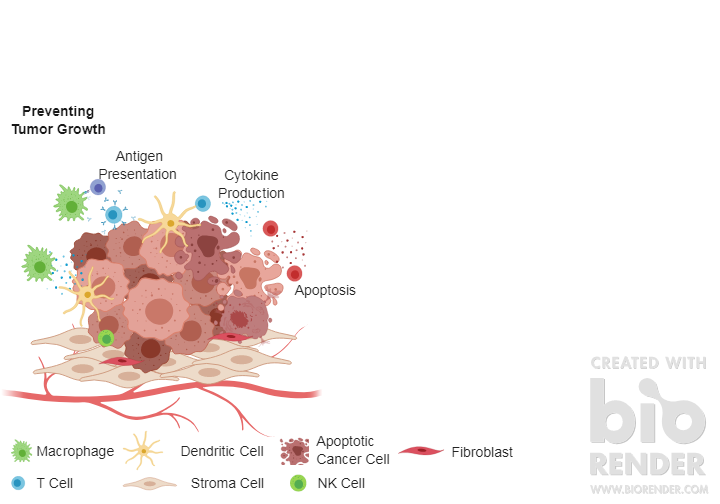

## Background
#### - Patient Tumor Tissues were collected from early resected Lung Adenocarcinoma Pateints.
#### - Samples were stained using the Opal multiplex system to quantitating immue cells that infiltrate the tumor.
#### - The Goal of this analysis is to correlate immune cell infiltration, HLADR expression with clinical data. 

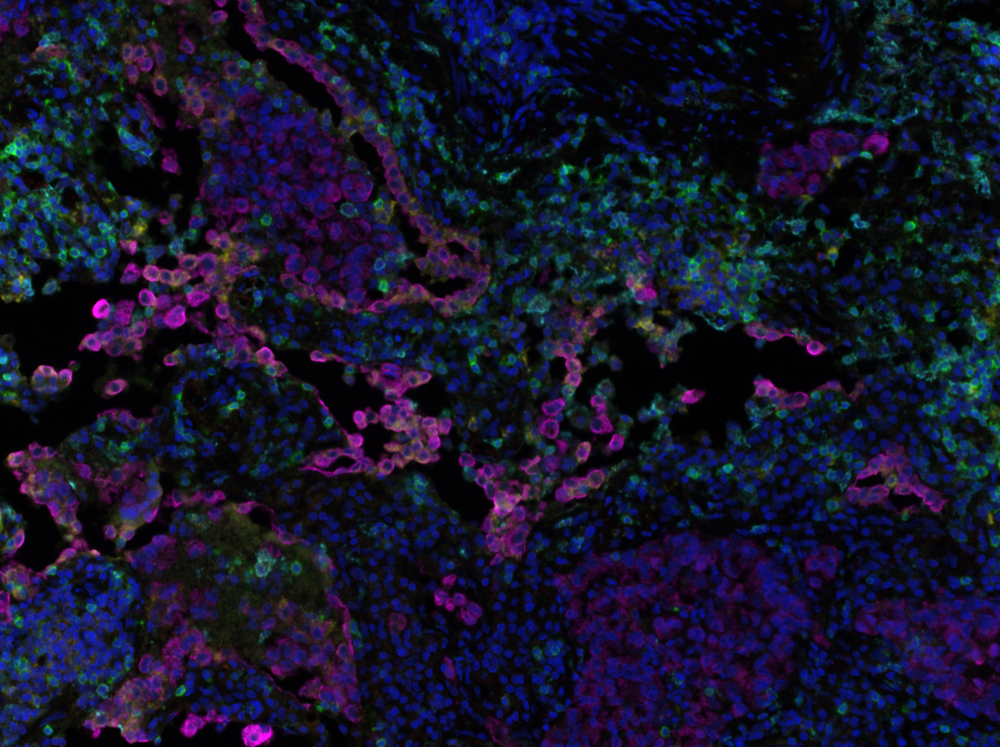

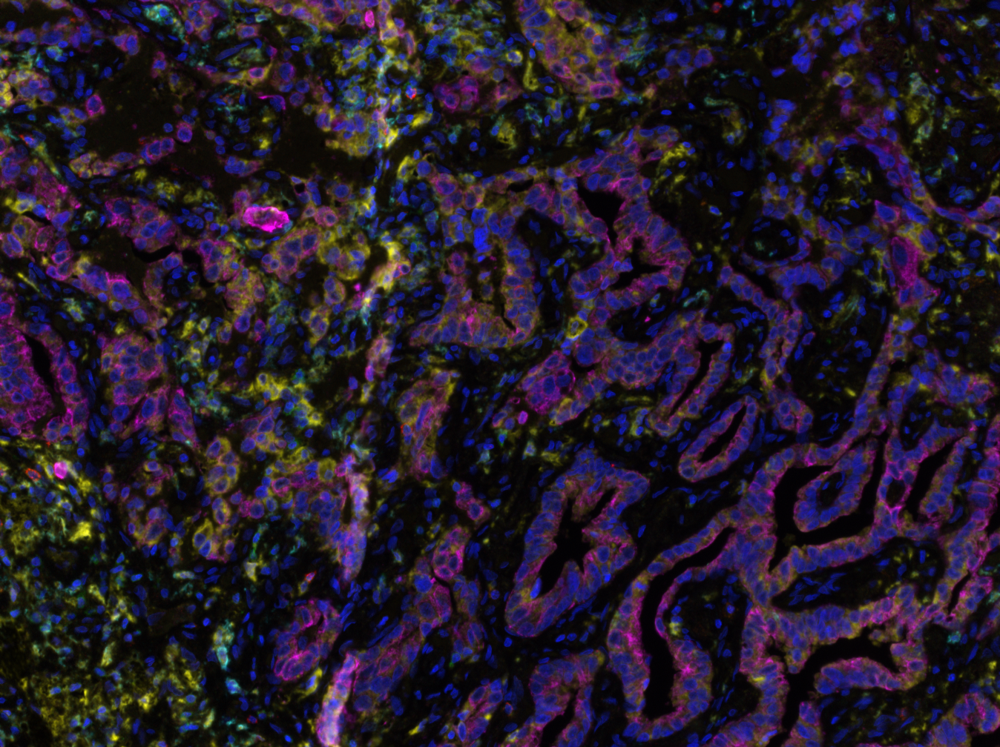

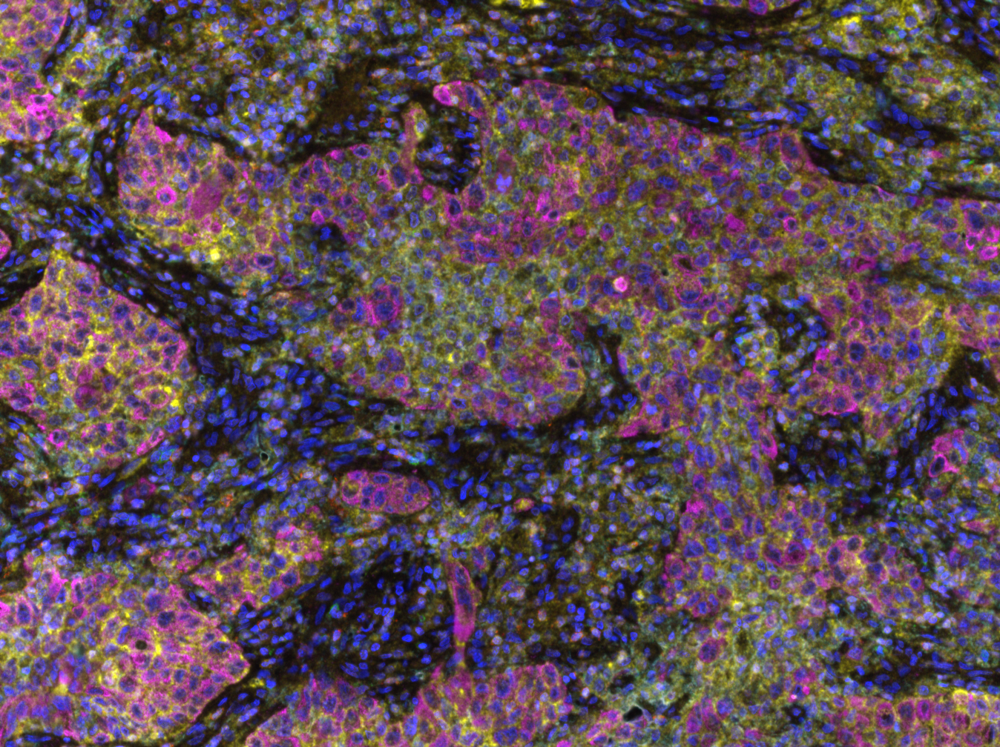

## Lung Cancer Dataset
Percentages of cell types, Percentages of HLADR positve cell types,
Clinical Data 

In [2]:
df = pd.read_csv('lung_cancer_data.csv') #input data 

In [3]:
df.head()

,PatientID,CD14_total,CD8_total,CD4_total,CD19_total,CK_total,Other_total,CD14_tumor,CD8_tumor,CD4_tumor,CD19_tumor,CD14_stroma,CD8+_stroma,CD4_stroma,CD19_stroma,CK_HLADR,CD14_HLADR_tumor,CD14_HLADR_stroma,CD14_HLADR_total,CD19_HLADR_tumor,CD19_HLADR_stroma,CD19_HLADR_total,HLADR_status,"Gender(1=F,0=M)",Age_at_Diagnosis,Stage_(numeric),Largest_Size,#_LN_taken,#_+_LN,Survival_(days),"Censor_(0=Alive,_1=Dead)",Recurrence_or_Lung_ca_death,Pack/years,Time_to_Recurrence
0,0-458-103,9.163393,1.871967,4.575919,2.831061,62.144673,19.412988,5.327016,0.912873,1.236422,0.670210,3.836376,0.959094,3.339496,2.160850,23.20,96.095445,97.590361,96.721311,89.655172,96.791444,95.102041,HLADR_high,0,83,2,2.0,30.0,0.0,3333,1,1,30.0,3333
1,0-783-207,4.671717,2.525253,4.166667,0.968013,45.777217,41.891134,0.252525,0.266554,0.406846,0.056117,4.419192,2.258698,3.759820,0.911897,2.74,77.777778,57.460317,58.558559,100.000000,90.769231,91.304348,HLADR_low,1,87,3,2.5,3.0,1.0,533,1,1,50.0,533
2,0-889-121,8.905852,5.266405,4.580153,3.554630,62.356388,15.336572,3.878479,1.287686,0.354692,1.372504,5.027373,3.978718,4.225461,2.182127,7.45,72.166998,78.067485,75.497835,69.662921,74.204947,72.451193,HLADR_low,1,85,1,1.8,1.0,0.0,3488,0,0,60.0,3488
3,1-037-393,8.031447,12.062893,16.893082,27.704403,17.144654,18.163522,1.735849,2.440252,0.893082,4.232704,6.295597,9.622642,16.000000,23.471698,8.34,55.797101,55.944056,55.912294,49.777117,46.463023,46.969353,HLADR_low,0,66,1,1.4,22.0,0.0,1605,1,1,30.0,1605
4,1-309-413,16.424752,3.845174,19.060351,1.502419,38.770053,20.397250,7.524828,1.044054,3.055768,0.776674,8.899924,2.801120,16.004584,0.725745,48.40,97.800338,93.991416,95.736434,91.803279,82.456140,87.288136,HLADR_high,1,80,1,1.2,18.0,0.0,2980,1,1,NaN,2980


In [4]:
df.columns #what are the columns named 

Index(['PatientID', 'CD14_total', 'CD8_total', 'CD4_total', 'CD19_total', 'CK_total', 'Other_total', 'CD14_tumor', 'CD8_tumor', 'CD4_tumor', 'CD19_tumor', 'CD14_stroma', 'CD8+_stroma', 'CD4_stroma', 'CD19_stroma', 'CK_HLADR', 'CD14_HLADR_tumor', 'CD14_HLADR_stroma', 'CD14_HLADR_total', 'CD19_HLADR_tumor', 'CD19_HLADR_stroma', 'CD19_HLADR_total', 'HLADR_status', 'Gender(1=F,0=M)', 'Age_at_Diagnosis', 'Stage_(numeric)', 'Largest_Size', '#_LN_taken', '#_+_LN', 'Survival_(days)', 'Censor_(0=Alive,_1=Dead)', 'Recurrence_or_Lung_ca_death', 'Pack/years', 'Time_to_Recurrence'], dtype='object')

In [5]:
print('The length is', len(df))

The length is 89


### Explaination of Column names 

##### CD14_total: Percentage of CD14+(myeloid) cells of the total cell count of both tumor and stroma
##### CD8_total: Percentage of CD8+ (Tcells) cells of the total cell count of both tumor and stroma
##### CD4_total: Percentage of CD4+ (Tcells) cells of the total cell count of both tumor and stroma
##### CD19_total: Percentage of CD19+ (Bcells) cells of the total cell count of both tumor and stroma
##### CK_total: Percentage of CK+ (tumor) cells of the total cell count of both tumor and stroma
##### Other_total: Percentage of Other (not pos for any of the makers) cells of the total cell count of both tumor and stroma
##### CD14_tumor: Percentage of CD14+(myeloid) cells in stroma
##### CD8_tumor: Percentage of CD8+ (Tcells) cells in stroma
##### CD4_tumor: Percentage of CD4+ (Tcells) cells in stroma
##### CD19_tumor: Percentage of CD19+ (Bcells) cells in stroma
##### CD14_stroma: Percentage of CD14+(myeloid) cells in stroma

##### CD8_stroma: Percentage of CD8+ (Tcells) cells in stroma
##### CD4_stroma: Percentage of CD4+ (Tcells) cells in stroma
##### CD19_stroma: Percentage of CD19+ (Bcells) cells in stroma
##### CK_HLADR: Percentage of CK+ cells that are HLADR+
##### CD14_HLADR_tumor: Percentage of CD14+ cells that are HLADR+ in the tumor
##### CD14_HLADR_stroma: Percentage of CD14+ cells that are HLADR+ in the stroma
##### CD14_HLADR_total: Percentage of CD14+ cells taht are HLADR+ in both the tumor and stroma
##### CD19_HLADR_tumor: Percentage of CD19+ cells that are HLADR+ in the tumor
##### CD19_HLADR_stroma: Percentage of CD19+ cells that are HLADR+ in the stroma
##### CD19_HLADR_total: Percentage of CD19+ cells that are HLADR+ in both the tumor and stroma
##### HLADR_status: If greater than 10% of CK+ are HLADR+ then HLADR high, if lower than HLADR low
##### Gender:(1=F, 0=Male)
##### Age at Diagnosis: (years)
##### Stage numeric (1-3): Cancer stage
##### Largest size
##### LN Taken: number of lymph nodes surgically removed 
##### L+LN
##### Survival (days)
##### Censor_(0=Alive, 1=Dead)
##### Pack years: average pack smoked per year
##### Time to recurrence (days)

##### Age at Diagnosis: (years)
##### Stage numeric (1-3): Cancer stage
##### Largest size
##### LN Taken: number of lymph nodes surgically removed 
##### L+LN
##### Survival (days)
##### Recurrence or Lung ca death (1=recurrence or death, 0=alive no recurrence)
##### Pack years: average pack smoked per year
##### Time to recurrence (days)

### Clean Data and Exploratory Data Analysis

In [6]:
#get rid of unwanted columns
df = df.drop(columns=['PatientID', 'Other_total', 'CK_total', '#_LN_taken', 'Recurrence_or_Lung_ca_death']) 
df.head()

,CD14_total,CD8_total,CD4_total,CD19_total,CD14_tumor,CD8_tumor,CD4_tumor,CD19_tumor,CD14_stroma,CD8+_stroma,CD4_stroma,CD19_stroma,CK_HLADR,CD14_HLADR_tumor,CD14_HLADR_stroma,CD14_HLADR_total,CD19_HLADR_tumor,CD19_HLADR_stroma,CD19_HLADR_total,HLADR_status,"Gender(1=F,0=M)",Age_at_Diagnosis,Stage_(numeric),Largest_Size,#_+_LN,Survival_(days),"Censor_(0=Alive,_1=Dead)",Pack/years,Time_to_Recurrence
0,9.163393,1.871967,4.575919,2.831061,5.327016,0.912873,1.236422,0.670210,3.836376,0.959094,3.339496,2.160850,23.20,96.095445,97.590361,96.721311,89.655172,96.791444,95.102041,HLADR_high,0,83,2,2.0,0.0,3333,1,30.0,3333
1,4.671717,2.525253,4.166667,0.968013,0.252525,0.266554,0.406846,0.056117,4.419192,2.258698,3.759820,0.911897,2.74,77.777778,57.460317,58.558559,100.000000,90.769231,91.304348,HLADR_low,1,87,3,2.5,1.0,533,1,50.0,533
2,8.905852,5.266405,4.580153,3.554630,3.878479,1.287686,0.354692,1.372504,5.027373,3.978718,4.225461,2.182127,7.45,72.166998,78.067485,75.497835,69.662921,74.204947,72.451193,HLADR_low,1,85,1,1.8,0.0,3488,0,60.0,3488
3,8.031447,12.062893,16.893082,27.704403,1.735849,2.440252,0.893082,4.232704,6.295597,9.622642,16.000000,23.471698,8.34,55.797101,55.944056,55.912294,49.777117,46.463023,46.969353,HLADR_low,0,66,1,1.4,0.0,1605,1,30.0,1605
4,16.424752,3.845174,19.060351,1.502419,7.524828,1.044054,3.055768,0.776674,8.899924,2.801120,16.004584,0.725745,48.40,97.800338,93.991416,95.736434,91.803279,82.456140,87.288136,HLADR_high,1,80,1,1.2,0.0,2980,1,NaN,2980


#### What are the column names?

In [7]:
df.columns

Index(['CD14_total', 'CD8_total', 'CD4_total', 'CD19_total', 'CD14_tumor', 'CD8_tumor', 'CD4_tumor', 'CD19_tumor', 'CD14_stroma', 'CD8+_stroma', 'CD4_stroma', 'CD19_stroma', 'CK_HLADR', 'CD14_HLADR_tumor', 'CD14_HLADR_stroma', 'CD14_HLADR_total', 'CD19_HLADR_tumor', 'CD19_HLADR_stroma', 'CD19_HLADR_total', 'HLADR_status', 'Gender(1=F,0=M)', 'Age_at_Diagnosis', 'Stage_(numeric)', 'Largest_Size', '#_+_LN', 'Survival_(days)', 'Censor_(0=Alive,_1=Dead)', 'Pack/years', 'Time_to_Recurrence'], dtype='object')

### Clean Data and Exploratory Data Analysis
#### What are the types of data?

In [8]:
df.dtypes
#determine the type of data 

CD14_total                  float64
CD8_total                   float64
CD4_total                   float64
CD19_total                  float64
CD14_tumor                  float64
CD8_tumor                   float64
CD4_tumor                   float64
CD19_tumor                  float64
CD14_stroma                 float64
CD8+_stroma                 float64
CD4_stroma                  float64
CD19_stroma                 float64
CK_HLADR                    float64
CD14_HLADR_tumor            float64
CD14_HLADR_stroma           float64
CD14_HLADR_total            float64
CD19_HLADR_tumor            float64
CD19_HLADR_stroma           float64
CD19_HLADR_total            float64
HLADR_status                 object
Gender(1=F,0=M)               int64
Age_at_Diagnosis              int64
Stage_(numeric)               int64
Largest_Size                float64
#_+_LN                      float64
Survival_(days)               int64
Censor_(0=Alive,_1=Dead)      int64
Pack/years                  

### Clean Data and Exploratory Data Analysis
#### Investigate Data

In [9]:
#How many stages are there?
df['Stage_(numeric)'].unique()

array([2, 3, 1, 4], dtype=int64)

In [10]:
#How many unique HLADR_status are there?
df['HLADR_status'].unique()

array(['HLADR_high', 'HLADR_low'], dtype=object)

In [11]:
#Make HLADR_status binary
df['HLADR_status']=df['HLADR_status'].apply(lambda x: 1 if x == 'HLADR_high' else 0) 

In [12]:
#Take a look at HLADR_status
df['HLADR_status'].head(10)

0    1
1    0
2    0
3    0
4    1
5    1
6    1
7    1
8    1
9    0
Name: HLADR_status, dtype: int64

### Clean Data and Exploratory Data Analysis
#### Check for null values

In [13]:
for c in df.columns.values: #cheking null values
    print(c, df[c].isnull().sum())

CD14_total 0
CD8_total 0
CD4_total 0
CD19_total 0
CD14_tumor 0
CD8_tumor 0
CD4_tumor 0
CD19_tumor 0
CD14_stroma 0
CD8+_stroma 0
CD4_stroma 0
CD19_stroma 0
CK_HLADR 0
CD14_HLADR_tumor 0
CD14_HLADR_stroma 0
CD14_HLADR_total 0
CD19_HLADR_tumor 0
CD19_HLADR_stroma 0
CD19_HLADR_total 0
HLADR_status 0
Gender(1=F,0=M) 0
Age_at_Diagnosis 0
Stage_(numeric) 0
Largest_Size 0
#_+_LN 4
Survival_(days) 0
Censor_(0=Alive,_1=Dead) 0
Pack/years 8
Time_to_Recurrence 0


#### Check for null values

In [14]:
print('There are', df['#_+_LN'].isnull().sum(), 'NA entries in', '# + LN')
print('There are', df['Pack/years'].isnull().sum(), 'NA entries in', 'Pack/years')

There are 4 NA entries in # + LN
There are 8 NA entries in Pack/years


In [15]:
#Remove NA values
df1 = df.dropna() # drop NA rows

In [16]:
print('There are', df1['#_+_LN'].isnull().sum(), 'NA entries in', '# + LN')
print('There are', df1['Pack/years'].isnull().sum(), 'NA entries in', 'Pack/years')

There are 0 NA entries in # + LN
There are 0 NA entries in Pack/years


In [17]:
print('The length is', len(df1))

The length is 77


In [18]:
print(df1.shape)

(77, 29)


In [19]:
df['Censor_(0=Alive,_1=Dead)'].value_counts()

1    56
0    33
Name: Censor_(0=Alive,_1=Dead), dtype: int64

### Clean Data and Exploratory Data Analysis
#### Histograms

count    89.000000
mean     70.280899
std      12.114969
min      32.000000
25%      65.000000
50%      73.000000
75%      78.000000
max      88.000000
Name: Age_at_Diagnosis, dtype: float64

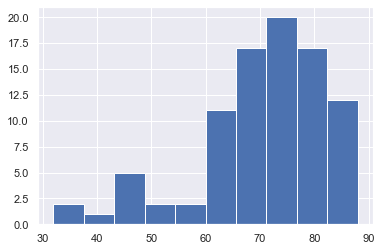

In [20]:
df['Age_at_Diagnosis'].hist()
#distribution of age 
df['Age_at_Diagnosis'].describe()

count    89.000000
mean     66.924087
std      26.428258
min       0.528169
25%      46.214099
50%      75.497835
75%      88.318357
max      99.625935
Name: CD14_HLADR_total, dtype: float64

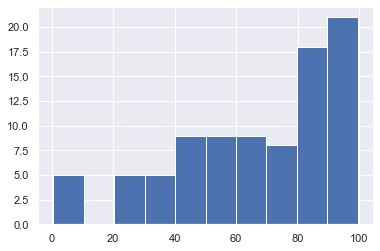

In [21]:
df['CD14_HLADR_total'].hist()
#distribution of CD14+ HLADR+ cell
df['CD14_HLADR_total'].describe()

count    89.000000
mean     65.805940
std      27.644459
min       0.000000
25%      50.524738
50%      72.088792
75%      90.721649
max      99.178082
Name: CD19_HLADR_total, dtype: float64

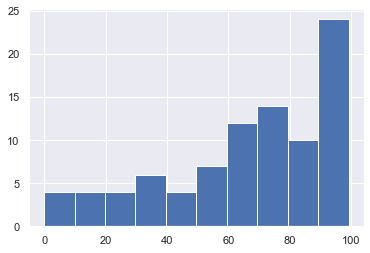

In [22]:
df['CD19_HLADR_total'].hist()
#distribution of CD14+ HLADR+ cell
df['CD19_HLADR_total'].describe()

count    89.000000
mean     19.639584
std      17.938151
min       0.000000
25%       3.350000
50%      15.500000
75%      34.100000
max      65.200000
Name: CK_HLADR, dtype: float64

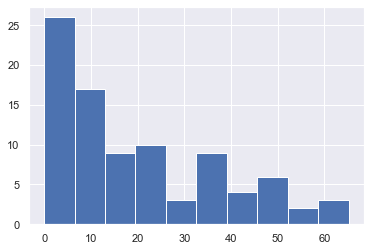

In [23]:
df['CK_HLADR'].hist()
#distribution of CK+ HLADR+
df['CK_HLADR'].describe()

### Clean Data and Exploratory Data Analysis
#### Correlation Matrices

In [24]:
#correlation matrix with numbers
corr = df1.corr()
corr.style.background_gradient(cmap='coolwarm')

,CD14_total,CD8_total,CD4_total,CD19_total,CD14_tumor,CD8_tumor,CD4_tumor,CD19_tumor,CD14_stroma,CD8+_stroma,CD4_stroma,CD19_stroma,CK_HLADR,CD14_HLADR_tumor,CD14_HLADR_stroma,CD14_HLADR_total,CD19_HLADR_tumor,CD19_HLADR_stroma,CD19_HLADR_total,HLADR_status,"Gender(1=F,0=M)",Age_at_Diagnosis,Stage_(numeric),Largest_Size,#_+_LN,Survival_(days),"Censor_(0=Alive,_1=Dead)",Pack/years,Time_to_Recurrence
CD14_total,1,0.278701,0.038311,-0.0420421,0.747545,0.386831,0.141519,-0.0214054,0.812677,0.182914,0.0142247,-0.0465875,0.234791,0.264829,0.231168,0.262424,0.152926,0.121112,0.14362,0.269166,-0.0217738,0.178883,0.104036,0.145351,0.0805541,-0.0462706,0.115066,-0.0195668,-0.0557452
CD8_total,0.278701,1,0.380163,0.290424,0.108545,0.617121,0.0776594,0.102394,0.314046,0.953028,0.388315,0.354732,0.195514,0.223158,0.186781,0.208786,0.153898,0.186187,0.174276,0.127189,-0.17023,-0.0608841,0.0914126,-0.0150687,0.0777962,-0.118955,0.0607557,0.25381,-0.0446663
CD4_total,0.038311,0.380163,1,0.118879,-0.0640495,0.0250453,0.398324,-0.0851047,0.11245,0.442971,0.98529,0.237123,0.340744,0.365751,0.311105,0.311945,0.220632,0.348011,0.297883,0.308149,-0.0413219,0.0370084,-0.241814,-0.169269,-0.145504,0.136833,-0.138261,0.0496292,0.17356
CD19_total,-0.0420421,0.290424,0.118879,1,0.00626984,0.182068,-0.0435651,0.797321,-0.0672393,0.275688,0.134069,0.899568,0.0990837,-0.00245439,0.0327921,0.0252644,-0.272595,-0.0800793,-0.150293,0.00186117,-0.140249,-0.143871,-0.0658783,-0.0281601,0.00562101,-0.00402124,-0.149965,0.175262,0.0163004
CD14_tumor,0.747545,0.108545,-0.0640495,0.00626984,1,0.506788,0.341895,0.151054,0.220467,-0.0658423,-0.131558,-0.100057,0.298598,0.27641,0.264359,0.322532,0.250759,0.200408,0.247944,0.287873,-0.0304867,0.104345,0.114764,0.0994375,0.126332,-0.0660629,0.0973096,0.00381625,-0.103421
CD8_tumor,0.386831,0.617121,0.0250453,0.182068,0.506788,1,0.304888,0.210748,0.123455,0.349806,-0.030267,0.116323,0.0961521,0.148682,0.113775,0.161592,0.101741,0.0404072,0.0703543,0.126482,-0.0170316,-0.067641,0.15466,0.0364121,0.204108,-0.151238,0.0327352,0.0723507,-0.147091
CD4_tumor,0.141519,0.0776594,0.398324,-0.0435651,0.341895,0.304888,1,-0.000932705,-0.0921249,-0.0248982,0.235718,-0.0636521,0.315656,0.286489,0.303568,0.326611,0.279901,0.301652,0.304529,0.309454,0.113901,0.0713818,-0.108514,-0.175812,0.0191636,0.105436,-0.0697714,-0.027079,0.0169832
CD19_tumor,-0.0214054,0.102394,-0.0851047,0.797321,0.151054,0.210748,-0.000932705,1,-0.163954,0.0407861,-0.0899947,0.453623,0.0471225,-0.140967,-0.0768565,-0.089854,-0.248599,-0.154207,-0.185109,-0.0410326,-0.11746,0.00101968,-0.0385459,0.0848893,0.0421595,-0.0816939,-0.138265,0.0426996,-0.0585015
CD14_stroma,0.812677,0.314046,0.11245,-0.0672393,0.220467,0.123455,-0.0921249,-0.163954,1,0.326373,0.136305,0.0193665,0.0828297,0.146406,0.107548,0.102412,0.00458147,0.00203483,-0.00661601,0.142719,-0.00522871,0.171149,0.0520944,0.126211,0.00746277,-0.00999129,0.0836045,-0.0320819,0.0088694
CD8+_stroma,0.182914,0.953028,0.442971,0.275688,-0.0658423,0.349806,-0.0248982,0.0407861,0.326373,1,0.473966,0.377558,0.195762,0.208455,0.178581,0.186375,0.144065,0.206115,0.180407,0.102742,-0.196115,-0.0464505,0.0493016,-0.031956,0.0140565,-0.0834094,0.0597335,0.27433,0.00343999


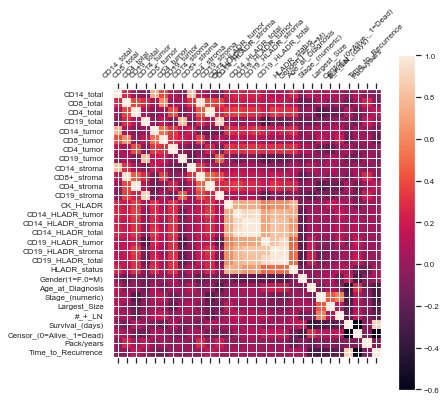

In [25]:
#correlation matrix with colors
import matplotlib.pyplot as plt
f = plt.figure(figsize=(6, 6))
plt.matshow(df1.corr(), fignum=f.number)
plt.xticks(range(df1.shape[1]), df1.columns, fontsize=8, rotation=45)
plt.yticks(range(df1.shape[1]), df1.columns, fontsize=8)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=8)

### Clean Data and Exploratory Data Analysis
#### Investigate top 5 features correlation

In [26]:
#Identify top 5 features that have most correlation with survival
#So the features that are high and contribute to death 
df1.corr()['Censor_(0=Alive,_1=Dead)'].sort_values(ascending=False).iloc[1:10]

Age_at_Diagnosis     0.304060
CD19_HLADR_tumor     0.190496
CD19_HLADR_total     0.187733
#_+_LN               0.169917
CD19_HLADR_stroma    0.163753
Largest_Size         0.143562
Stage_(numeric)      0.130713
CD14_total           0.115066
CD14_HLADR_stroma    0.112367
Name: Censor_(0=Alive,_1=Dead), dtype: float64

In [27]:
#Identify top 5 features that have most correlation with HLADR expression on Cancer cells
df1.corr()['CK_HLADR'].sort_values(ascending=False).iloc[1:10]

HLADR_status         0.751098
CD14_HLADR_total     0.733060
CD14_HLADR_tumor     0.726994
CD14_HLADR_stroma    0.726588
CD19_HLADR_stroma    0.626821
CD19_HLADR_total     0.620490
CD19_HLADR_tumor     0.557674
CD4_total            0.340744
CD4_tumor            0.315656
Name: CK_HLADR, dtype: float64

In [28]:
#What is negatively correlated with survival
#when high then patients are alive
df1.corr()['Censor_(0=Alive,_1=Dead)'].sort_values(ascending=True).iloc[1:10]

Time_to_Recurrence   -0.548076
Gender(1=F,0=M)      -0.288666
CD19_total           -0.149965
CD19_tumor           -0.138265
CD4_total            -0.138261
CD4_stroma           -0.133489
CD19_stroma          -0.121375
HLADR_status         -0.120493
CK_HLADR             -0.086969
Name: Censor_(0=Alive,_1=Dead), dtype: float64

In [29]:
#What is negatively correlated with HLADR on cancer cells
df1.corr()['CK_HLADR'].sort_values(ascending=True).iloc[1:9]

Censor_(0=Alive,_1=Dead)   -0.086969
Pack/years                  0.008260
Age_at_Diagnosis            0.016842
Stage_(numeric)             0.037660
Time_to_Recurrence          0.043932
CD19_tumor                  0.047123
CD14_stroma                 0.082830
Survival_(days)             0.084510
Name: CK_HLADR, dtype: float64

### Linear Regression
##### Investigate CD4 cell percentage to HLADR positve CK cell percentage

In [30]:
df1['CK_HLADR'].describe()

count    77.000000
mean     19.061987
std      18.173805
min       0.000000
25%       3.220000
50%      14.500000
75%      29.100000
max      65.200000
Name: CK_HLADR, dtype: float64

Text(0, 0.5, 'CD4_total')

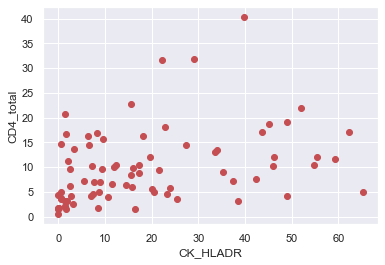

In [31]:
plt.plot(df1['CK_HLADR'], df1['CD4_total'], 'ro');
plt.xlabel('CK_HLADR')
plt.ylabel('CD4_total')


In [32]:
import statsmodels.formula.api as smf
import statsmodels.api as sm

### Simple Linear Regression 
#### Compare CD4 T cells to HLADR expression on the CK+ cells (HLADR_CK)

In [33]:
model = smf.ols(formula='CD4_total~CK_HLADR', data=df1).fit()
predictions = model.predict()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              CD4_total   R-squared:                       0.116
Model:                            OLS   Adj. R-squared:                  0.104
Method:                 Least Squares   F-statistic:                     9.852
Date:                Fri, 13 Dec 2019   Prob (F-statistic):            0.00243
Time:                        11:40:21   Log-Likelihood:                -259.14
No. Observations:                  77   AIC:                             522.3
Df Residuals:                      75   BIC:                             527.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.2797      1.176      6.189      0.000       4.937       9.623
CK_HLADR       0.1406      0.045      3.139      0.002       0.051       0.230
==============================================================================
Omnibus:                       31.032   Durbin-Watson:                   2.059
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               57.201
Skew:                           1.514   Prob(JB):                     3.79e-13
Kurtosis:                       5.944   Cond. No.                         38.2
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Determining $\beta_0$ and $\beta_1$

In [34]:
x = df1['CK_HLADR']
y = df1['CD4_total']

beta1_est = np.sum((x - np.mean(x)) * (y - np.mean(y))) / np.sum( (x - np.mean(x)) ** 2 )
beta1_est

0.14060415217840574

In [35]:
beta0_est = np.mean(y) - beta1_est * np.mean(x)
beta0_est

7.279724383475912

### Linear Regression Model

In [36]:
#Model of linear regression
beta0,beta1 = model.params
print('Model is Y = ', beta0, '+', beta1, '*CK_HLADR')

Model is Y =  7.279724383475905 + 0.1406041521784058 *CK_HLADR


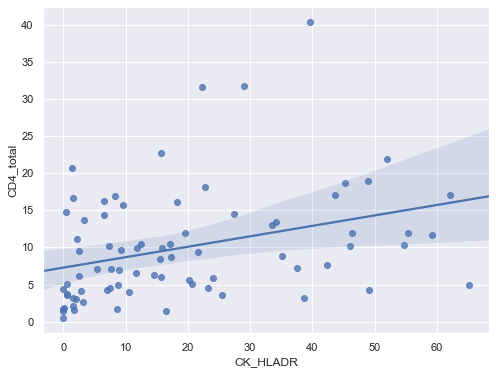

In [37]:
#plot the data with the regression line plotted over it
plt.figure(figsize=(8,6))
sns.regplot(x="CK_HLADR", y = "CD4_total", data=df1, ci=99)

### How good is our model?

In [38]:
%matplotlib inline
import numpy as np
import scipy as sp
import scipy.stats as stats
import pandas as pd
import matplotlib.pyplot as plt

In [39]:
stats.norm.interval(0.95, loc=np.mean(y), scale= stats.sem(y))

(8.284905857655286, 11.634931954890178)

In [40]:
yhat = beta0 + beta1*df1['CD4_total']
residuals = df1['CD4_total'] - yhat

RSS = np.sum( residuals ** 2)

print('RSS is', RSS, 'and RSS from statsmodel is', np.sum(model.resid**2))

RSS is 3282.7985283195735 and RSS from statsmodel is 3777.8472189340678


In [41]:
RSE = np.sqrt(RSS / (len(residuals)-2))

print('RSE is ', RSE, 'and model RSE is', np.sqrt(model.mse_resid))

RSE is  6.615938863401095 and model RSE is 7.097273860606919


In [42]:
model.conf_int(0.05)

,0,1
Intercept,4.936723,9.622726
CK_HLADR,0.051366,0.229842


In [43]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              CD4_total   R-squared:                       0.116
Model:                            OLS   Adj. R-squared:                  0.104
Method:                 Least Squares   F-statistic:                     9.852
Date:                Fri, 13 Dec 2019   Prob (F-statistic):            0.00243
Time:                        11:40:47   Log-Likelihood:                -259.14
No. Observations:                  77   AIC:                             522.3
Df Residuals:                      75   BIC:                             527.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.2797      1.176      6.189      0.000       4.937       9.623
CK_HLADR       0.1406      0.045      3.139      0.002       0.051       0.230
==============================================================================
Omnibus:                       31.032   Durbin-Watson:                   2.059
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               57.201
Skew:                           1.514   Prob(JB):                     3.79e-13
Kurtosis:                       5.944   Cond. No.                         38.2
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Simple Linear Regression 
#### Compare percentage of CD4 tumor infiltration (CD4_tumor) to  HLADR positve CK cell percentage (HLADR_CK)

Text(0, 0.5, 'CD4_tumor')

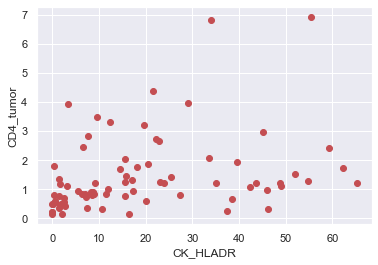

In [44]:
#Scatter plot
plt.plot(df1['CK_HLADR'], df1['CD4_tumor'], 'ro');
plt.xlabel('CK_HLADR')
plt.ylabel('CD4_tumor')

### Simple Linear Regression
### Model Summary

In [45]:
model = smf.ols(formula='CD4_tumor~CK_HLADR', data=df1).fit()
predictions = model.predict()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              CD4_tumor   R-squared:                       0.100
Model:                            OLS   Adj. R-squared:                  0.088
Method:                 Least Squares   F-statistic:                     8.300
Date:                Fri, 13 Dec 2019   Prob (F-statistic):            0.00517
Time:                        11:41:02   Log-Likelihood:                -126.02
No. Observations:                  77   AIC:                             256.0
Df Residuals:                      75   BIC:                             260.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.0138      0.209      4.857      0.000       0.598       1.430
CK_HLADR       0.0229      0.008      2.881      0.005       0.007       0.039
==============================================================================
Omnibus:                       44.395   Durbin-Watson:                   2.311
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              115.890
Skew:                           1.992   Prob(JB):                     6.83e-26
Kurtosis:                       7.499   Cond. No.                         38.2
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Determining $\beta_0$ and $\beta_1$

In [46]:
x = df1['CK_HLADR']
y = df1['CD4_tumor']

beta1_est = np.sum((x - np.mean(x)) * (y - np.mean(y))) / np.sum( (x - np.mean(x)) ** 2 )
beta1_est

0.02290395261823874

In [47]:
beta0_est = np.mean(y) - beta1_est * np.mean(x)
beta0_est

1.013782487826881

### Model

In [48]:
#plot the data with the regression line plotted over it
beta0,beta1 = model.params
print('Model is Y = ', beta0, '+', beta1, '*CK_HLADR')

Model is Y =  1.013782487826881 + 0.02290395261823875 *CK_HLADR


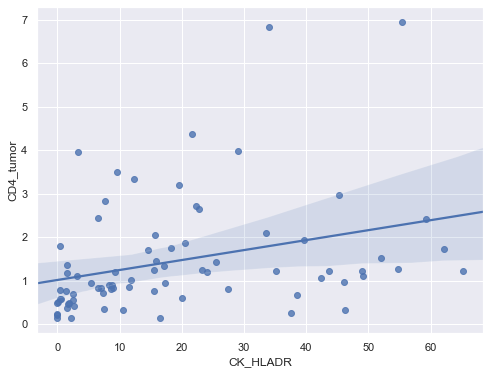

In [49]:
plt.figure(figsize=(8,6))
sns.regplot(x="CK_HLADR", y = "CD4_tumor", data=df1, ci=99)

### Multiple linear regression
#### Linear Regression with top 10 features that correlate with percentage of HLADR pos CK cells

In [50]:
import statsmodels.formula.api as smf
import statsmodels.api as sm

In [51]:
df1.columns

Index(['CD14_total', 'CD8_total', 'CD4_total', 'CD19_total', 'CD14_tumor', 'CD8_tumor', 'CD4_tumor', 'CD19_tumor', 'CD14_stroma', 'CD8+_stroma', 'CD4_stroma', 'CD19_stroma', 'CK_HLADR', 'CD14_HLADR_tumor', 'CD14_HLADR_stroma', 'CD14_HLADR_total', 'CD19_HLADR_tumor', 'CD19_HLADR_stroma', 'CD19_HLADR_total', 'HLADR_status', 'Gender(1=F,0=M)', 'Age_at_Diagnosis', 'Stage_(numeric)', 'Largest_Size', '#_+_LN', 'Survival_(days)', 'Censor_(0=Alive,_1=Dead)', 'Pack/years', 'Time_to_Recurrence'], dtype='object')

In [52]:
#Identify top 5 features that have most correlation with HLADR expression on Cancer cells
df1.corr()['CK_HLADR'].sort_values(ascending=False).iloc[1:10]

HLADR_status         0.751098
CD14_HLADR_total     0.733060
CD14_HLADR_tumor     0.726994
CD14_HLADR_stroma    0.726588
CD19_HLADR_stroma    0.626821
CD19_HLADR_total     0.620490
CD19_HLADR_tumor     0.557674
CD4_total            0.340744
CD4_tumor            0.315656
Name: CK_HLADR, dtype: float64

### Multiple linear regression
#### Model Summary 

In [53]:
model_trn = smf.ols(formula='CK_HLADR~CD14_HLADR_total+CD14_HLADR_tumor+CD14_HLADR_stroma+CD19_HLADR_stroma+CD19_HLADR_total+CD19_HLADR_tumor+CD4_total+CD4_tumor', data=df1).fit()
model_trn.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               CK_HLADR   R-squared:                       0.571
Model:                            OLS   Adj. R-squared:                  0.520
Method:                 Least Squares   F-statistic:                     11.29
Date:                Fri, 13 Dec 2019   Prob (F-statistic):           5.08e-10
Time:                        11:41:21   Log-Likelihood:                -299.51
No. Observations:                  77   AIC:                             617.0
Df Residuals:                      68   BIC:                             638.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept           -18.0692      4.868     -3.712      0.000     -27.783      -8.355
CD14_HLADR_total     -0.3771      0.623     -0.605      0.547      -1.620       0.866
CD14_HLADR_tumor      0.3454      0.236      1.464      0.148      -0.125       0.816
CD14_HLADR_stroma     0.5132      0.460      1.115      0.269      -0.405       1.432
CD19_HLADR_stroma    -0.2642      0.390     -0.677      0.501      -1.043       0.514
CD19_HLADR_total      0.3416      0.531      0.644      0.522      -0.717       1.400
CD19_HLADR_tumor     -0.0615      0.196     -0.314      0.754      -0.452       0.329
CD4_total             0.1751      0.240      0.730      0.468      -0.303       0.654
CD4_tumor             1.2041      1.308      0.920      0.361      -1.407       3.815
==============================================================================
Omnibus:                        6.983   Durbin-Watson:                   1.813
Prob(Omnibus):                  0.030   Jarque-Bera (JB):                6.693
Skew:                           0.717   Prob(JB):                       0.0352
Kurtosis:                       3.165   Cond. No.                         589.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Multiple linear regression
#### Investigate percentage of CD4 in tumor and stroma and CK_HLADR

In [54]:
model_trn = smf.ols(formula='CK_HLADR~CD4_tumor+CD4_total', data=df1).fit()
model_trn.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               CK_HLADR   R-squared:                       0.155
Model:                            OLS   Adj. R-squared:                  0.132
Method:                 Least Squares   F-statistic:                     6.766
Date:                Fri, 13 Dec 2019   Prob (F-statistic):            0.00200
Time:                        11:41:24   Log-Likelihood:                -325.59
No. Observations:                  77   AIC:                             657.2
Df Residuals:                      74   BIC:                             664.2
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      8.6187      3.441      2.505      0.014       1.762      15.475
CD4_tumor      2.9474      1.606      1.835      0.070      -0.253       6.147
CD4_total      0.6193      0.282      2.193      0.031       0.057       1.182
==============================================================================
Omnibus:                       12.658   Durbin-Watson:                   1.981
Prob(Omnibus):                  0.002   Jarque-Bera (JB):               14.073
Skew:                           1.040   Prob(JB):                     0.000879
Kurtosis:                       3.241   Cond. No.                         22.8
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

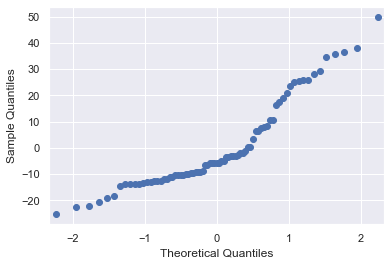

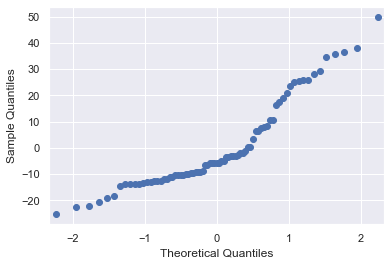

In [55]:
sm.qqplot(model_trn.resid)

### How good is our model?

Text(0, 0.5, 'residuals')

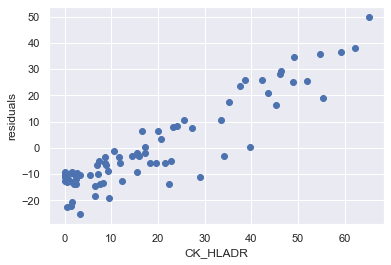

In [56]:
plt.plot(df1.CK_HLADR, model_trn.resid, 'bo');
plt.xlabel('CK_HLADR')
plt.ylabel('residuals')

In [57]:
print(model_trn.f_test('CD4_total = 0'))
print(model_trn.f_test('CD4_tumor = 0'))

<F test: F=array([[4.80963962]]), p=0.0314435057339747, df_denom=74, df_num=1>
<F test: F=array([[3.3682044]]), p=0.07048443821972777, df_denom=74, df_num=1>


### Logistic Regression 
#### Does percentage CD4 Tcells predict HLADR status. HLADR low or HLADR high
#### HLADR is classification 

In [58]:
x = np.array(df1['CD4_tumor'])
x = x.reshape(x.shape+(1,)) #shape needs to be 2d for .fit function later
y = np.array(df1['HLADR_status'])
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=42)

In [59]:
model = LogisticRegression(class_weight="balanced", random_state=0)
model.fit(x_train, y_train)
print(model.coef_, model.intercept_)

[[0.87997498]] [-1.03217062]


#### Confusion matrix 

In [60]:
y_pred = model.predict(x_test)
pd.DataFrame(confusion_matrix(y_test, y_pred))


,0,1
0,7,2
1,3,8


In [61]:
model.predict_proba(x_test)[:,1]

array([0.31002825, 0.3718479 , 0.36731254, 0.51395892, 0.42712126,
       0.99316108, 0.49798382, 0.50789812, 0.79585859, 0.86921734,
       0.40274641, 0.3750889 , 0.91999324, 0.75371446, 0.32028963,
       0.43836104, 0.74739264, 0.9937981 , 0.34913729, 0.64976314])

#### Plot the model

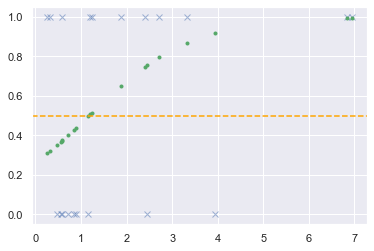

In [62]:
p = model.predict_proba(x_test)[:,1]
plt.plot(x_test, y_test, 'bx', alpha=0.5)
plt.plot(x_test, p, 'g.')
plt.axhline(y=0.5,color='orange',ls='--')

#### How good is our model?

In [63]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
print('acc', accuracy_score(y_test, y_pred))
print('recall', recall_score(y_test, y_pred))
print('precision', precision_score(y_test, y_pred))
print('F1', f1_score(y_test, y_pred))

acc 0.75
recall 0.7272727272727273
precision 0.8
F1 0.761904761904762


0.7525252525252525


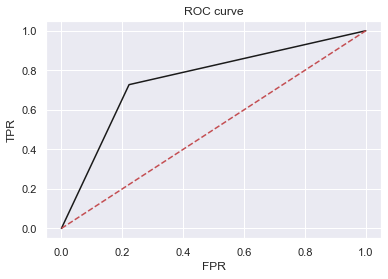

In [64]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, th = roc_curve(y_test,y_pred)
plt.plot(fpr,tpr,'k-')
plt.plot(np.arange(0,1.1,0.1),np.arange(0,1.1,0.1),'r--')
plt.title('ROC curve')
plt.xlabel('FPR')
plt.ylabel('TPR')
print(auc(fpr,tpr))

### Logistic Regression for Survival
#### Scatter Plot for each predictor of Survival

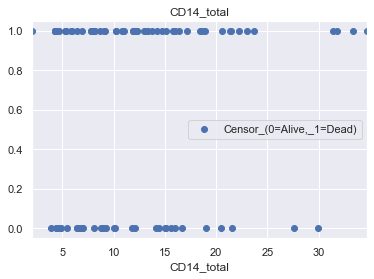

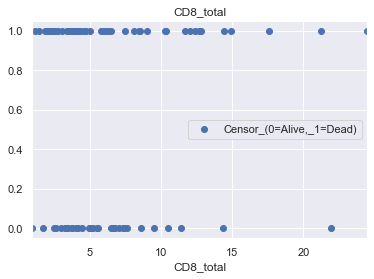

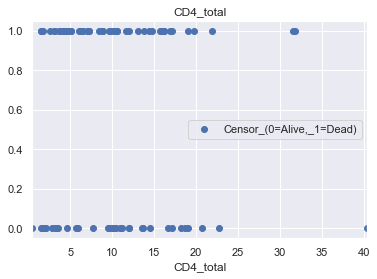

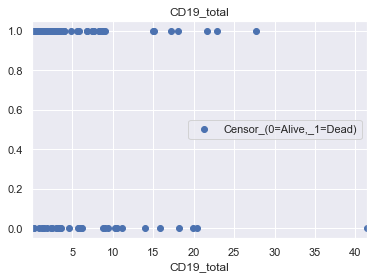

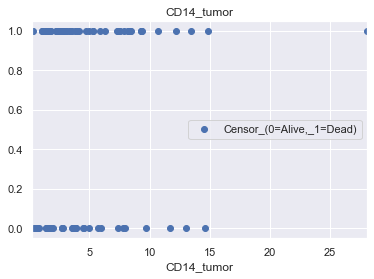

...

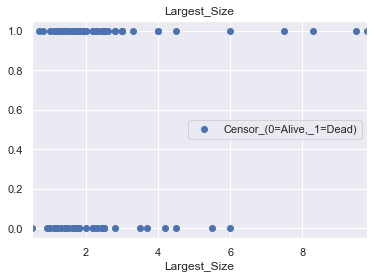

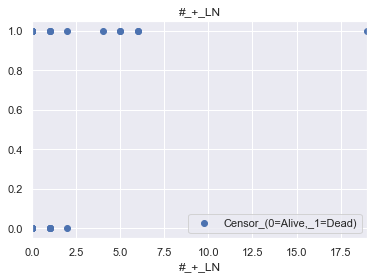

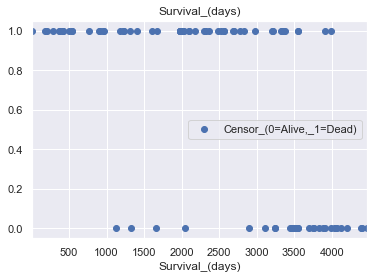

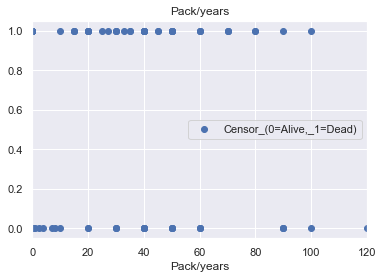

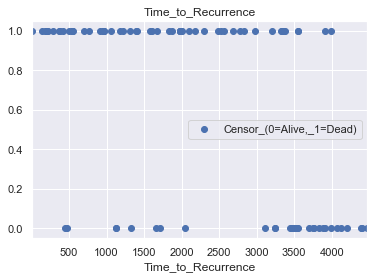

In [65]:
for c in df1.drop(['Censor_(0=Alive,_1=Dead)'], axis=1, inplace=False).columns.values:
    df.plot(x=c, y='Censor_(0=Alive,_1=Dead)', style='o')
    plt.title(c)
    plt.show()

### Logistic Regression for Survival
#### Does percentage of HLADR+ cancer cells  predict survival using Logistic Regression?

In [67]:
x = np.array(df1['CK_HLADR'])
x = x.reshape(x.shape+(1,)) #shape needs to be 2d for .fit function later
y = np.array(df1['Censor_(0=Alive,_1=Dead)'])
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=42)

#### Model

In [68]:
model = LogisticRegression(class_weight="balanced", max_iter=10000, solver='lbfgs', random_state=0)
model.fit(x_train, y_train)
print(model.coef_, model.intercept_)

[[-0.0030038]] [0.05584303]


In [71]:
#Confusion Matrix
yp = model.predict(x_test)
pd.DataFrame(confusion_matrix(y_test, yp))


,0,1
0,5,3
1,5,7


### Logistic Regression for Survival
#### Plot

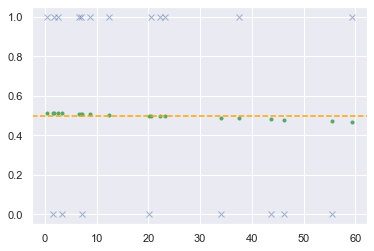

In [72]:
p = model.predict_proba(x_test)[:,1]
plt.plot(x_test, y_test, 'bx', alpha=0.5)
plt.plot(x_test, p, 'g.')
plt.axhline(y=0.5,color='orange',ls='--')

### Logistic Regression for Survival
#### How good is our model?

In [73]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
print('acc', accuracy_score(y_test, yp))
print('recall', recall_score(y_test, yp))
print('precision', precision_score(y_test, yp))
print('F1', f1_score(y_test, yp))

acc 0.6
recall 0.5833333333333334
precision 0.7
F1 0.6363636363636365


0.6041666666666667


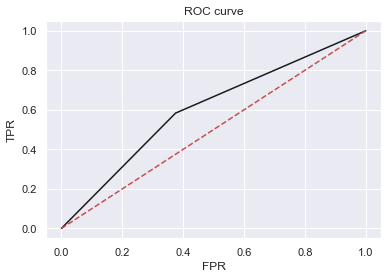

In [74]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, th = roc_curve(y_test,yp)
plt.plot(fpr,tpr,'k-')
plt.plot(np.arange(0,1.1,0.1),np.arange(0,1.1,0.1),'r--')
plt.title('ROC curve')
plt.xlabel('FPR')
plt.ylabel('TPR')
print(auc(fpr,tpr))

### Multiple Logistic Regression for Survival
#### 

In [75]:
y = df1['Censor_(0=Alive,_1=Dead)']
X = df1.drop(['Censor_(0=Alive,_1=Dead)',], axis = 1)

In [105]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42) 
#Create x_train, y_train, x_test, y_test

#### Model

In [106]:
clf = LogisticRegression().fit(X_train,y_train)
print(model.coef_, model.intercept_)

[[-0.0030038]] [0.05584303]


C:\Users\Ross and Amber\Anaconda3\envs\sklearnnew1\lib\site-packages\sklearn\linear_model\_logistic.py:931: ConvergenceWarning: lbfgs failed to converge (status=1): b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'. Increase the number of iterations.
  n_iter_i = _check_optimize_result(solver, opt_res, max_iter)


In [107]:
ypred = clf.predict(X_test)
pd.DataFrame(confusion_matrix(y_test, ypred))

,0,1
0,6,2
1,3,9


In [108]:
print('acc', accuracy_score(y_test, ypred))
print('recall', recall_score(y_test, ypred))
print('precision', precision_score(y_test, ypred))
print('F1', f1_score(y_test, ypred))

acc 0.75
recall 0.75
precision 0.8181818181818182
F1 0.7826086956521738


In [109]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
clf = LogisticRegression(class_weight="balanced", max_iter=10000, solver='lbfgs').fit(X_train, y_train)
RFE(clf, 1, step=1)

RFE(estimator=LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                                 fit_intercept=True, intercept_scaling=1,
                                 l1_ratio=None, max_iter=10000,
                                 multi_class='auto', n_jobs=None, penalty='l2',
                                 random_state=None, solver='lbfgs', tol=0.0001,
                                 verbose=0, warm_start=False),
    n_features_to_select=1, step=1, verbose=0)

### Multiple Logistic Regression for Survival
#### Recursive Feature Elimination

In [110]:
selector = RFE(clf, 1, step=1)
selector = selector.fit(X_train, y_train)

In [111]:
print(selector.ranking_)
print(selector.support_)

[17  8 10 25  6  5  3 13 16  7  9 14 18 20 21 19 26 22 23  2  1 15 12 11
  4 27 24 28]
[False False False False False False False False False False False False
 False False False False False False False False  True False False False
 False False False False]


In [112]:
ranking = selector.ranking_ #what are the rankings
print(ranking)
feature_name = X.columns #what are the features
print(feature_name)

 #create a raking list with dictionary
value=feature_name
key=ranking
d = dict(zip(key,value))


[17  8 10 25  6  5  3 13 16  7  9 14 18 20 21 19 26 22 23  2  1 15 12 11
  4 27 24 28]
Index(['CD14_total', 'CD8_total', 'CD4_total', 'CD19_total', 'CD14_tumor', 'CD8_tumor', 'CD4_tumor', 'CD19_tumor', 'CD14_stroma', 'CD8+_stroma', 'CD4_stroma', 'CD19_stroma', 'CK_HLADR', 'CD14_HLADR_tumor', 'CD14_HLADR_stroma', 'CD14_HLADR_total', 'CD19_HLADR_tumor', 'CD19_HLADR_stroma', 'CD19_HLADR_total', 'HLADR_status', 'Gender(1=F,0=M)', 'Age_at_Diagnosis', 'Stage_(numeric)', 'Largest_Size', '#_+_LN', 'Survival_(days)', 'Pack/years', 'Time_to_Recurrence'], dtype='object')


In [113]:
#order ranking list
print(sorted(d.items()))


[(1, 'Gender(1=F,0=M)'), (2, 'HLADR_status'), (3, 'CD4_tumor'), (4, '#_+_LN'), (5, 'CD8_tumor'), (6, 'CD14_tumor'), (7, 'CD8+_stroma'), (8, 'CD8_total'), (9, 'CD4_stroma'), (10, 'CD4_total'), (11, 'Largest_Size'), (12, 'Stage_(numeric)'), (13, 'CD19_tumor'), (14, 'CD19_stroma'), (15, 'Age_at_Diagnosis'), (16, 'CD14_stroma'), (17, 'CD14_total'), (18, 'CK_HLADR'), (19, 'CD14_HLADR_total'), (20, 'CD14_HLADR_tumor'), (21, 'CD14_HLADR_stroma'), (22, 'CD19_HLADR_stroma'), (23, 'CD19_HLADR_total'), (24, 'Pack/years'), (25, 'CD19_total'), (26, 'CD19_HLADR_tumor'), (27, 'Survival_(days)'), (28, 'Time_to_Recurrence')]


In [114]:
selector.n_features_

1

In [115]:
print('The accuracy score is', selector.score(X_test, y_test))

The accuracy score is 0.6


In [116]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

In [117]:
from sklearn.feature_selection import RFECV

### Logistic Regression 
#### Recursive Feature Elimination and Cross Validation 

In [118]:
rfecv = RFECV(clf, step=1, scoring='accuracy')
rfecv = rfecv.fit(X_train,y_train)

In [119]:
 #determines ranking
rfecv.ranking_


array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 2])

In [120]:
#What are the features?
feature_importance = list(zip(feature_name, rfecv.ranking_))
print(feature_importance)

[('CD14_total', 1), ('CD8_total', 1), ('CD4_total', 1), ('CD19_total', 1), ('CD14_tumor', 1), ('CD8_tumor', 1), ('CD4_tumor', 1), ('CD19_tumor', 1), ('CD14_stroma', 1), ('CD8+_stroma', 1), ('CD4_stroma', 1), ('CD19_stroma', 1), ('CK_HLADR', 1), ('CD14_HLADR_tumor', 1), ('CD14_HLADR_stroma', 1), ('CD14_HLADR_total', 1), ('CD19_HLADR_tumor', 1), ('CD19_HLADR_stroma', 1), ('CD19_HLADR_total', 1), ('HLADR_status', 1), ('Gender(1=F,0=M)', 1), ('Age_at_Diagnosis', 1), ('Stage_(numeric)', 1), ('Largest_Size', 1), ('#_+_LN', 1), ('Survival_(days)', 1), ('Pack/years', 1), ('Time_to_Recurrence', 2)]


In [121]:
rfecv.support_

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
       False])

In [122]:
#scores corresponds to the number of features
rfecv.grid_scores_


array([0.64848485, 0.64848485, 0.59545455, 0.55909091, 0.57878788,
       0.59545455, 0.59545455, 0.5969697 , 0.52878788, 0.51363636,
       0.58333333, 0.56818182, 0.58484848, 0.58181818, 0.58181818,
       0.6       , 0.68939394, 0.70454545, 0.63181818, 0.66969697,
       0.63636364, 0.69090909, 0.67272727, 0.70606061, 0.67121212,
       0.75454545, 0.80909091, 0.77424242])

### Logistic Regression 
#### What are the optimal number of features using rfecv?

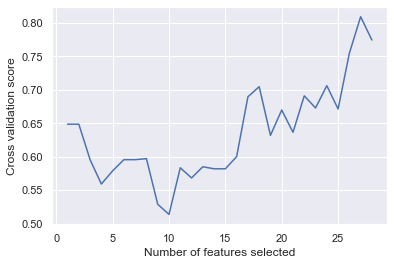

In [123]:
# Plot number of features VS. scores(metrics)
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()


In [124]:
#The number of selected features
rfecv.n_features_

27

In [125]:
print('The accuracy score is', rfecv.score(X_test, y_test))

The accuracy score is 0.65


### Decision Tree
#### Model: Decision Tree Classifier

In [126]:
# This function creates images of tree models using pydot
def print_tree(estimator, features, class_names=None, filled=True):
 tree = estimator
 names = features
 color = filled
 classn = class_names

 dot_data = StringIO()
 export_graphviz(estimator, out_file=dot_data, feature_names=features, class_names=classn, filled=filled)
 graph = pydot.graph_from_dot_data(dot_data.getvalue())
 return(graph)

In [127]:
y = df1['Censor_(0=Alive,_1=Dead)']
X = df1.drop(['Censor_(0=Alive,_1=Dead)',], axis = 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) 
#Create x_train, y_train, x_test, y_test

In [128]:
clf = DecisionTreeClassifier(random_state=0)
clf.fit(X_train, y_train)
pred = clf.predict(X_test)


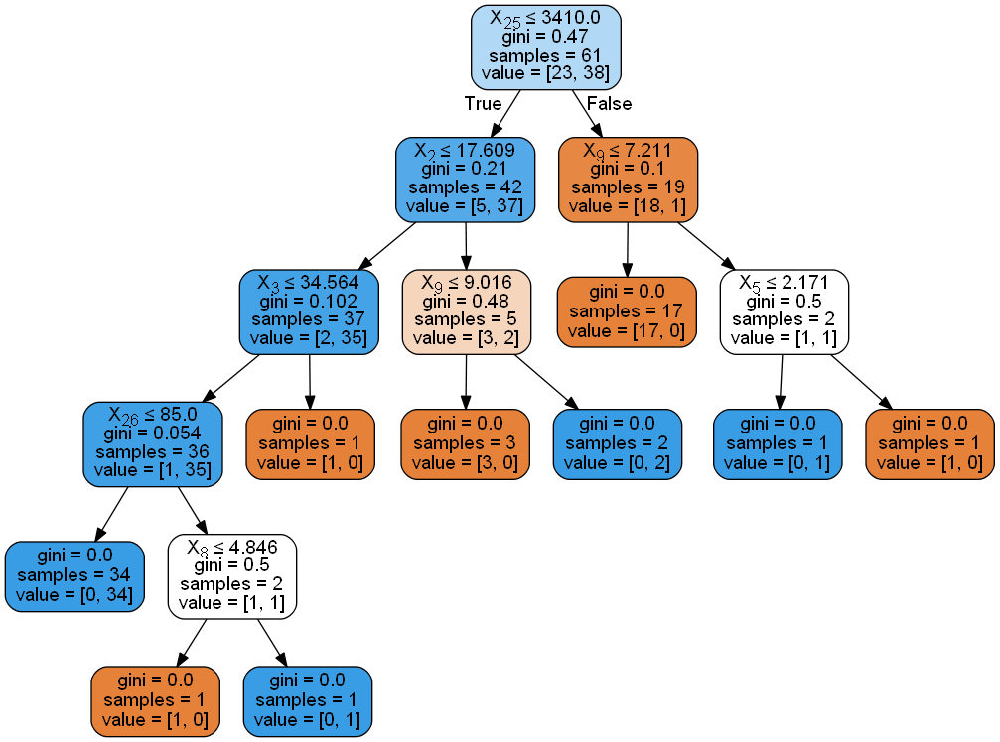

In [129]:
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

### Decision Tree
#### How good is our model?

In [130]:
err1 = mean_squared_error(y_test, pred)
print('The mean squared error is', mean_squared_error(y_test, pred))
print('The accuaracy', accuracy_score(y_test, pred))

The mean squared error is 0.3125
The accuaracy 0.6875


#### Choose the best parameters

In [131]:
param_space={
'max_depth' : [3, 5, 7, 9, None],
'min_samples_split' : [2, 3, 5],
'min_samples_leaf' : [1, 2, 3, 5],
'max_features' : [4, 10, None]}

In [132]:
from sklearn.model_selection import GridSearchCV
dt = DecisionTreeClassifier()
GS = GridSearchCV(dt, param_space, cv=5)

In [137]:
dt = DecisionTreeClassifier()
GS = GridSearchCV(dt, param_space, cv=5)
GS.fit(X_train,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': [3, 5, 7, 9, None],
                    

In [134]:
GridSearchCV(cv=5, error_score=None,
 estimator=DecisionTreeRegressor(ccp_alpha=0.0,
criterion='gini', max_depth=None,
 max_features=None,
 max_leaf_nodes=None,
 min_impurity_decrease=0.0,
 min_impurity_split=None,
 min_samples_leaf=1,
 min_samples_split=2,
 min_weight_fraction_leaf=0.0,
 presort='deprecated',
 random_state=None,
 splitter='best'),
 iid='deprecated', n_jobs=None,
 param_grid={'max_depth': [3, 5, 7, 9, None],
 'max_features': [4, 8, None],
 'min_samples_leaf': [1, 2, 3, 5],
 'min_samples_split': [2, 3, 5]},
 pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
 scoring=None, verbose=0)


GridSearchCV(cv=5, error_score=None,
             estimator=DecisionTreeRegressor(ccp_alpha=0.0, criterion='gini',
                                             max_depth=None, max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort='deprecated',
                                             random_state=None,
                                             splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': [3, 5, 7, 9, None],
                         'max_features': [4, 8, None],
                         'min_samples_le

### Decision Tree
#### New parameters

In [138]:
GS.best_params_

{'max_depth': 3,
 'max_features': None,
 'min_samples_leaf': 2,
 'min_samples_split': 5}

In [144]:
clf1 = DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=3,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')
clf1.fit(X_train,y_train)
pred2 = clf1.predict(X_test)


In [157]:
print('The mean squared error is', mean_squared_error(y_test, pred2))
print('The accuaracy', accuracy_score(y_test, pred2))

The mean squared error is 0.375
The accuaracy 0.625


#### Graph with new parameters

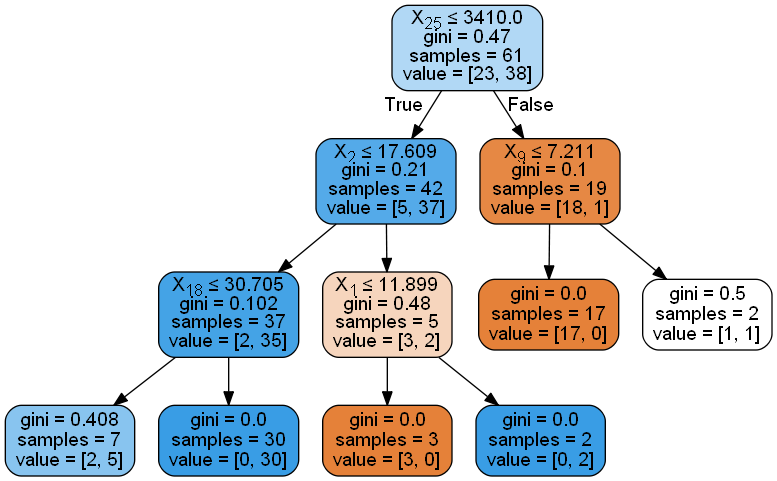

In [146]:
dot_data = StringIO()
export_graphviz(clf1, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [147]:
from sklearn.ensemble import RandomForestClassifier as RFC


### Decision Tree
#### Try to prevent over fitting using oob and Random Forest 

In [162]:
rfc1 = RandomForestClassifier(random_state=0)
rfc1.fit(X_train, y_train)

print('Err:', mean_squared_error(y_test,pred))
print('Score:', rfc1.score(X_test, y_test))

Err: 0.375
Score: 0.625


In [163]:
#Bagging using all features
rfc = RandomForestClassifier(random_state=0, oob_score=True,max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=3)
rfc.fit(X_train, y_train)
pred = rfc.predict(X_test)
print(mean_squared_error(y_test,pred))
print('Score:', rfc.score(X_test, y_test))

0.375
Score: 0.625


### PCA

In [164]:
pca = PCA(2) # project from 64 to 2 dimensions
projected = pca.fit_transform(df1)
print(df1.shape)
print(projected.shape)
print(pca.explained_variance_)

(77, 29)
(77, 2)
[3337988.01224747  185332.20300595]


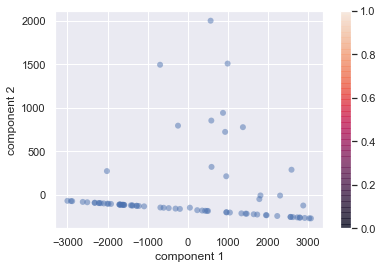

In [165]:
fig=plt.figure(figsize=(6,4))
plt.scatter(projected[:, 0], projected[:, 1],
 edgecolor='none', alpha=0.5, cmap=plt.cm.get_cmap('Spectral', 10))
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar()


#### SVM with 2 features

In [166]:
y = df1['Censor_(0=Alive,_1=Dead)']
X = df1[['CD4_total', 'CK_HLADR']]

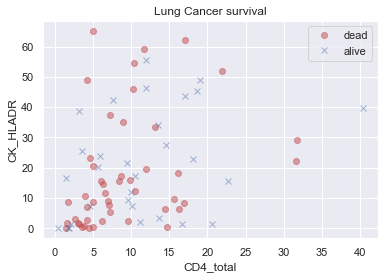

In [167]:
plt.figure(figsize=(6,4))
plt.plot(X[y==1]['CD4_total'],X[y==1]['CK_HLADR'],'ro',alpha=0.5,label='dead')
plt.plot(X[y==0]['CD4_total'],X[y==0]['CK_HLADR'],'bx',alpha=0.5,label='alive')
plt.xlabel('CD4_total')
plt.ylabel('CK_HLADR')
plt.title('Lung Cancer survival')
plt.legend()

In [169]:
from sklearn.svm import SVC

In [170]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [171]:
svc = SVC(C=1,kernel='linear').fit(X_train,y_train)

svc

svc.coef_ 

array([[ 3.93395628e-06, -1.92328044e-06]])

In [172]:
svc.intercept_

array([1.00008567])

In [173]:
a = svc.coef_[0][0]
b = svc.coef_[0][1]
c = svc.intercept_[0]

In [174]:
svc.support_

array([ 1,  4,  5,  6,  7,  9, 17, 25, 26, 33, 34, 35, 38, 40, 41, 42, 46,
       47, 48, 49, 52, 54, 60,  0,  2,  3, 12, 13, 14, 15, 19, 20, 23, 27,
       29, 30, 31, 37, 39, 43, 44, 50, 53, 55, 56, 57, 58, 59])

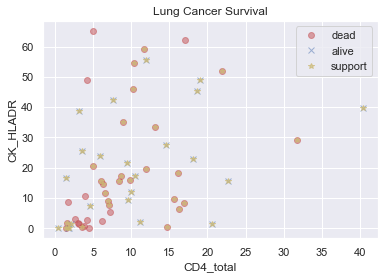

In [175]:
support = X_train.iloc[list(svc.support_)]
plt.figure(figsize=(6,4))
plt.plot(X_train[y_train==1]['CD4_total'],X_train[y_train==1]['CK_HLADR'],'ro',alpha=0.5,label='dead')
plt.plot(X_train[y_train==0]['CD4_total'],X_train[y_train==0]['CK_HLADR'],'bx',alpha=0.5,label='alive')
plt.plot(support['CD4_total'],support['CK_HLADR'],'y*',alpha=0.7,label='support')
plt.xlabel('CD4_total')
plt.ylabel('CK_HLADR')
plt.title('Lung Cancer Survival')
plt.legend()

In [176]:
svc.support_vectors_ #support vectors are the data points within the margin and on the wrong hyperplane

array([[11.98943935, 55.4       ],
       [ 0.43525571,  0.        ],
       [40.37004546, 39.7       ],
       [ 1.71041308,  0.        ],
       [19.01479977, 48.9       ],
       [ 9.58640028,  9.27      ],
       [14.54362078, 27.4       ],
       [20.63525901,  1.38      ],
       [ 3.17676424, 38.6       ],
       [ 2.04275534,  1.48      ],
       [ 1.77695688,  0.093     ],
       [11.17960213,  2.13      ],
       [ 5.86895766, 24.        ],
       [ 1.46400976, 16.5       ],
       [18.14711359, 22.8       ],
       [ 9.44437777, 21.6       ],
       [ 3.55438205, 25.5       ],
       [ 9.97375328, 11.9       ],
       [10.45971074, 17.2       ],
       [18.62075599, 45.2       ],
       [ 7.66488414, 42.4       ],
       [ 4.58015267,  7.45      ],
       [22.65943012, 15.6       ],
       [11.67911534, 59.3       ],
       [ 1.53165419,  1.69      ],
       [ 5.02157709, 20.6       ],
       [16.20955316,  6.47      ],
       [ 7.05621647,  7.61      ],
       [ 6.31628938,

In [177]:
svc.n_support_

array([23, 25])

#### Conclusion 
#### CD4 T cells are infiltraiting when there are more positve HLADR CK+ cells. Modeled with Simple linear Regression and Logistic Regression 
#### Logistic Regression is the best model for predicting survival. 
#### Problems: Small dataset with only 77 patients. 